# PREPARATION

## IMPORTS

In [21]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import os
import matplotlib.pyplot as plt
import warnings

In [22]:
#try:
#    # Disable all GPUS
#    tf.config.set_visible_devices([], 'GPU')
#    visible_devices = tf.config.get_visible_devices()
#    for device in visible_devices:
#        assert device.device_type != 'GPU'
#except:
#    # Invalid device or cannot modify virtual devices once initialized.
#    pass

In [23]:
# Prevent CUDA from allowing all GPU memory, to avoid OOM errors
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
  tf.config.experimental.set_memory_growth(gpu, True)

## PARAMETERS DEFINITION

In [24]:
DATA_PATH = "images"
ROOT_PATH = '/home/guillaume/code/35m5loKiUe/WGAN_DATA/'
MODEL_PATH = 'model_saves'
GIF_PATH = 'gif_pics'

NB_FILTERS = 512
IMAGE_SIZE = 64
BUFFER_SIZE = 60000
BATCH_SIZE = 64
NOISE_DIM = 100
EPOCHS = 100
MODEL_SAVE_FRQ = 5

## DATASET LOADING

In [25]:
train_dataset = tf.keras.utils.image_dataset_from_directory(
    os.path.join(ROOT_PATH, DATA_PATH),
    label_mode=None,
    color_mode='rgb',
    batch_size=BATCH_SIZE,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
)

Found 63565 files belonging to 1 classes.


In [26]:
#for images in train_dataset.take(1):
#    print(np.min(images[0]))
#    plt.axis("off")
#    break

In [27]:
normalization_layer = tf.keras.layers.Rescaling(scale=1./255)
train_dataset = train_dataset.map(lambda x: (normalization_layer(x)))

# MODEL DEFINITION

In [35]:
class WGAN(keras.Model):
    def __init__(
        self,
        image_size,
        nb_filters,
        latent_dim,
        discriminator_extra_steps=3,
        gp_weight=10.0,
    ):
        super().__init__()
        self.image_size = image_size
        self.nb_filters = nb_filters
        self.latent_dim = latent_dim
        self.d_steps = discriminator_extra_steps
        self.gp_weight = gp_weight     
        self.discriminator = self.make_discriminator()
        self.generator = self.make_generator()
        self.g_optimizer = keras.optimizers.Adam(
            learning_rate=0.0002, beta_1=0.5, beta_2=0.9
        )
        self.d_optimizer = keras.optimizers.Adam(
            learning_rate=0.0002, beta_1=0.5, beta_2=0.9
        )


    
    def make_discriminator(self):
        discriminator = tf.keras.Sequential()
        i = self.image_size
        while i <= self.nb_filters:    
            discriminator.add(layers.Conv2D(i, (3, 3), strides=(2, 2), padding='same'))
            discriminator.add(layers.LeakyReLU())
            discriminator.add(layers.Dropout(0.2))
            i = 2*i
        discriminator.add(layers.Flatten())
        discriminator.add(layers.Dense(self.image_size))
        discriminator.add(layers.LeakyReLU())
        discriminator.add(layers.Dropout(0.2))
        discriminator.add(layers.Dense(self.image_size/2))
        discriminator.add(layers.LeakyReLU())
        discriminator.add(layers.Dropout(0.2))
        discriminator.add(layers.Dense(1))
        return discriminator
    
    def make_generator(self):
        generator = tf.keras.Sequential()
        # Dense layer to get sufficient dimensions to create 1st convolution
        generator.add(layers.Dense(8 * 8 * self.nb_filters, use_bias=False, input_shape=(100,)))
        generator.add(layers.BatchNormalization())
        generator.add(layers.LeakyReLU())
        # Reshape for 1st convolution
        generator.add(layers.Reshape((8, 8, self.nb_filters)))
        # upsampling layers to increase image size
        i = 16
        while i <= self.image_size:
            generator.add(layers.UpSampling2D(size=(2, 2), data_format=None, interpolation='nearest'))
            generator.add(layers.Conv2D(i, (5, 5), strides=(1, 1), padding='same', use_bias=False))
            generator.add(layers.BatchNormalization(momentum=0.9, epsilon=0.00001))
            generator.add(layers.LeakyReLU(alpha=0.2))
            i = 2*i
        #Last convolution layer to return a 3 channels (RGB) image
        generator.add(layers.Conv2D(3, (5, 5), strides=(1, 1), padding='same', use_bias=False, activation=None))
        generator.add(layers.Activation('sigmoid'))
        return generator
    
    @tf.function
    def gradient_penalty(self, batch_size, real_images, fake_images):
        """Calculates the gradient penalty.
        This loss is calculated on an interpolated image
        and added to the discriminator loss.
        """
        # Get the interpolated image
        alpha = tf.random.normal(
            [batch_size, 1, 1, 1],
            mean=0.0,
            stddev=1.0
        )
        diff = fake_images - real_images
        interpolated = real_images + alpha * diff

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            # 1. Get the discriminator output for this interpolated image.
            pred = self.discriminator(interpolated, training=True)

        # 2. Calculate the gradients w.r.t to this interpolated image.
        grads = gp_tape.gradient(pred, [interpolated])[0]
        # 3. Calculate the norm of the gradients.
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        gp = tf.reduce_mean((norm - 1.0) ** 2)
        return gp
    
    @tf.function
    def discriminator_loss(self, real_img, fake_img):
        real_loss = tf.reduce_mean(real_img)
        fake_loss = tf.reduce_mean(fake_img)
        return fake_loss - real_loss
    
    @tf.function
    def generator_loss(self, fake_img):
        return -tf.reduce_mean(fake_img) 
    
    @tf.function
    def train_step(self, real_images):
        if isinstance(real_images, tuple):
            real_images = real_images[0]
        # Get the batch size
        batch_size = tf.shape(real_images)[0]
        for i in range(self.d_steps):
            # Get the latent vector
            random_latent_vectors = tf.random.normal(
                shape=(batch_size, self.latent_dim)
            )
            with tf.GradientTape() as tape:
                # Generate fake images from the latent vector
                fake_images = self.generator(random_latent_vectors, training=True)
                # Get the logits for the fake images
                fake_logits = self.discriminator(fake_images, training=True)
                # Get the logits for the real images
                real_logits = self.discriminator(real_images, training=True)
                # Calculate the discriminator loss using the fake and real image logits
                d_cost = self.discriminator_loss(real_logits, fake_logits)
                # Calculate the gradient penalty
                gp = self.gradient_penalty(batch_size, real_images, fake_images)
                # Add the gradient penalty to the original discriminator loss
                d_loss = d_cost + gp * self.gp_weight

            # Get the gradients w.r.t the discriminator loss
            d_gradient = tape.gradient(d_loss, self.discriminator.trainable_variables)
            # Update the weights of the discriminator using the discriminator optimizer
            self.d_optimizer.apply_gradients(
                zip(d_gradient, self.discriminator.trainable_variables)
            )

        # Train the generator
        # Get the latent vector
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        with tf.GradientTape() as tape:
            # Generate fake images using the generator
            generated_images = self.generator(random_latent_vectors, training=True)
            # Get the discriminator logits for fake images
            gen_img_logits = self.discriminator(generated_images, training=True)
            # Calculate the generator loss
            g_loss = self.generator_loss(gen_img_logits)

        # Get the gradients w.r.t the generator loss
        gen_gradient = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update the weights of the generator using the generator optimizer
        self.g_optimizer.apply_gradients(
            zip(gen_gradient, self.generator.trainable_variables)
        )
        return {"d_loss": d_loss, "g_loss": g_loss}

# MONITORING

In [36]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, sqr_size=5, latent_dim=128, latent_vec=tf.random.normal(shape=(1,128))):
        self.sqr_size = sqr_size
        self.latent_dim = latent_dim
        self.latent_vec = latent_vec

    def on_epoch_end(self, epoch, logs=None):
        
        if not epoch%MODEL_SAVE_FRQ :
            self.model.generator.save(os.path.join(ROOT_PATH, MODEL_PATH, 'generator_after_epoch_{epoch}').format(epoch=epoch))
            self.model.discriminator.save(os.path.join(ROOT_PATH, MODEL_PATH, 'discriminator_after_epoch_{epoch}').format(epoch=epoch))
              
        generated_images = self.model.generator(self.latent_vec)
        generated_images.numpy()

        fig = plt.figure(figsize=(10, 10))
        for i in range(generated_images.shape[0]):
            plt.subplot(self.sqr_size, self.sqr_size, i+1)
            img = keras.utils.array_to_img(generated_images[i]) 
            plt.imshow(img)
            plt.axis('off')
        plt.savefig(os.path.join(ROOT_PATH, GIF_PATH,'image_at_epoch_{:04d}.png').format(epoch)) 
        plt.show()


# INSTANCIATION

## MONITOR

In [37]:

# Instantiate the customer `GANMonitor` Keras callback.
latent_vec=tf.random.normal(shape=(5**2, NOISE_DIM))
cbk = GANMonitor(sqr_size=5, latent_dim=NOISE_DIM, latent_vec=latent_vec)

## MODEL

In [38]:
wgan = WGAN(
    image_size=IMAGE_SIZE,
    nb_filters=NB_FILTERS,
    latent_dim=NOISE_DIM,
    discriminator_extra_steps=3,
    gp_weight=10.0
)

In [39]:
## Get the wgan model
#wgan = WGAN(
#    latent_dim=NOISE_DIM,
#    discriminator_extra_steps=3,
#)

In [40]:
# Compile the wgan model
wgan.compile(metrics=['accuracy'])

# TRAIN

Epoch 1/100
994/994 [==============================] - ETA: 0s - d_loss: -1.6536 - g_loss: 1.1023WARNING:tensorflow:Compiled the loaded model, but the compiled metrics have yet to be built. `model.compile_metrics` will be empty until you train or evaluate the model.


INFO:tensorflow:Assets written to: /home/guillaume/code/35m5loKiUe/WGAN_DATA/model_saves/generator_after_epoch_0/assets


INFO:tensorflow:Assets written to: /home/guillaume/code/35m5loKiUe/WGAN_DATA/model_saves/generator_after_epoch_0/assets


INFO:tensorflow:Assets written to: /home/guillaume/code/35m5loKiUe/WGAN_DATA/model_saves/discriminator_after_epoch_0/assets


INFO:tensorflow:Assets written to: /home/guillaume/code/35m5loKiUe/WGAN_DATA/model_saves/discriminator_after_epoch_0/assets


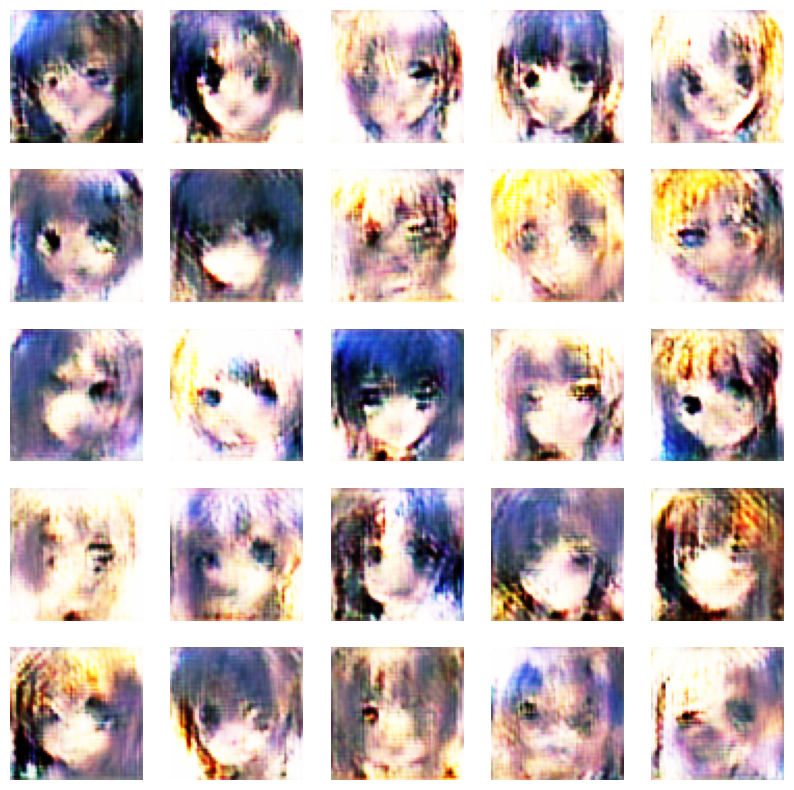

994/994 [==============================] - 173s 169ms/step - d_loss: -1.6559 - g_loss: 1.1095
Epoch 2/100
994/994 [==============================] - ETA: 0s - d_loss: -0.9946 - g_loss: 6.4182

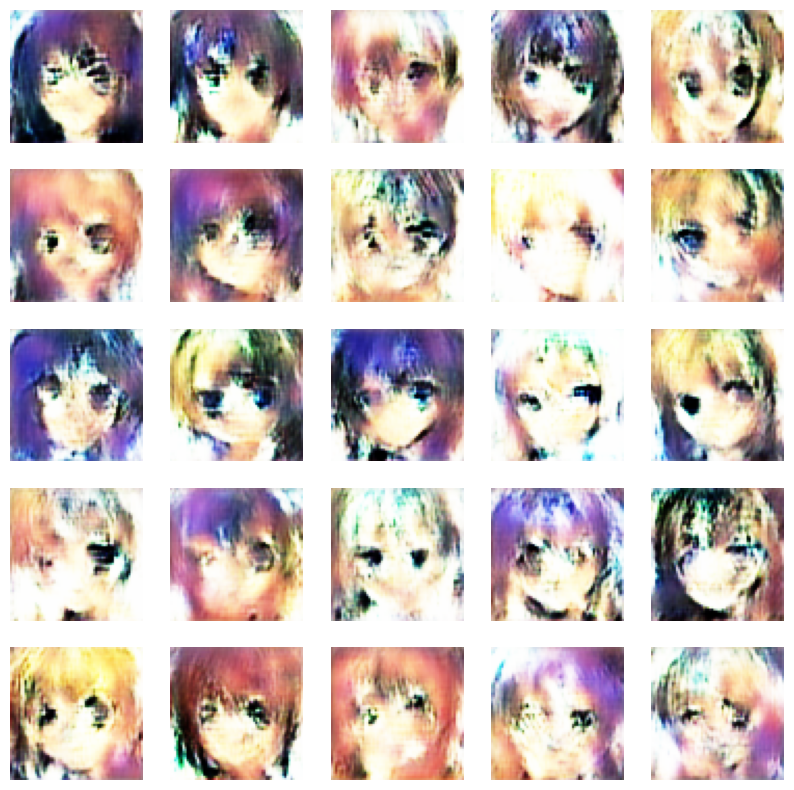

994/994 [==============================] - 163s 164ms/step - d_loss: -0.9829 - g_loss: 6.3991
Epoch 3/100
994/994 [==============================] - ETA: 0s - d_loss: -0.6244 - g_loss: 73.3217

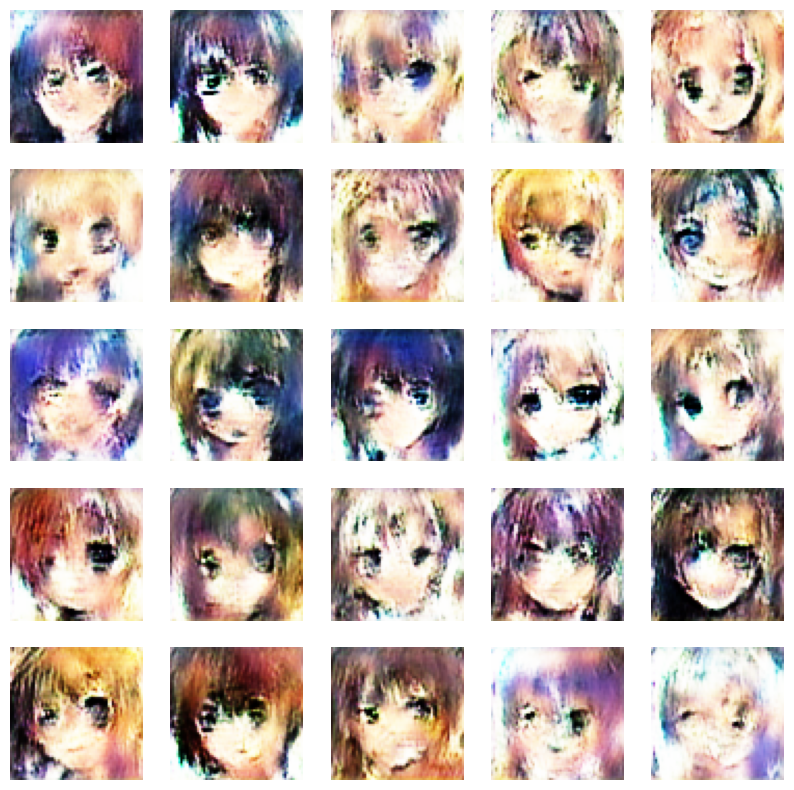

994/994 [==============================] - 165s 166ms/step - d_loss: -0.6394 - g_loss: 73.3373
Epoch 4/100
994/994 [==============================] - ETA: 0s - d_loss: -1.8260 - g_loss: 94.9539

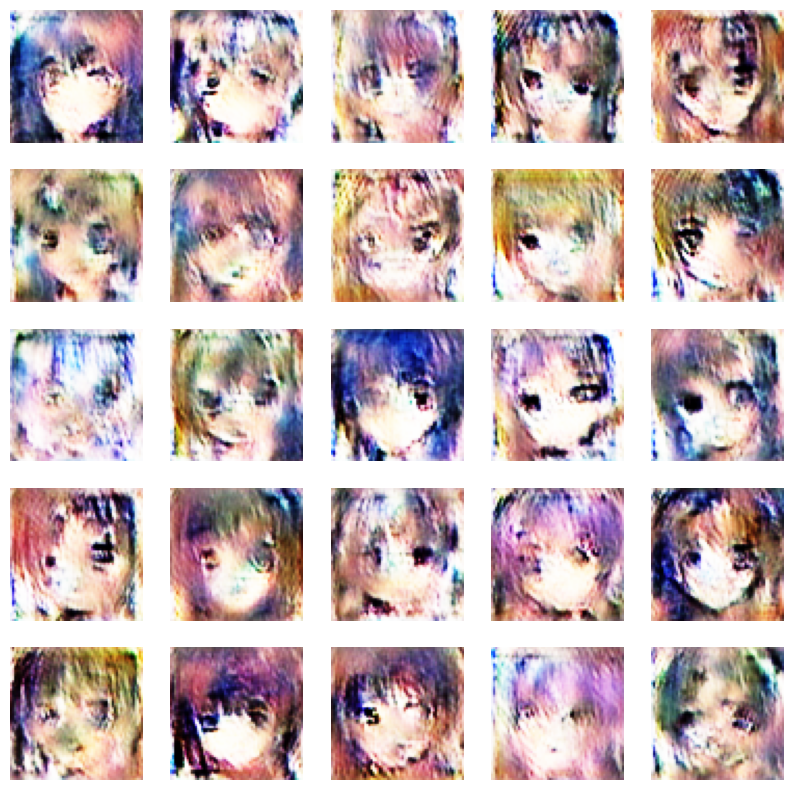

994/994 [==============================] - 164s 165ms/step - d_loss: -1.8929 - g_loss: 94.9306
Epoch 5/100
994/994 [==============================] - ETA: 0s - d_loss: 0.2314 - g_loss: 25.8913

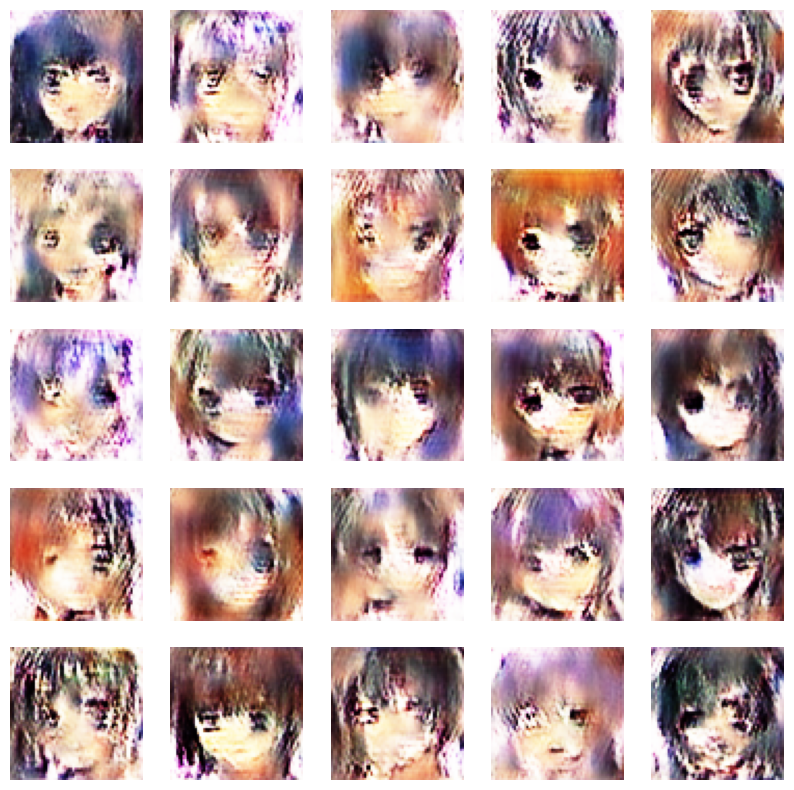

994/994 [==============================] - 163s 164ms/step - d_loss: 0.2264 - g_loss: 25.8794
Epoch 6/100
994/994 [==============================] - ETA: 0s - d_loss: 0.1606 - g_loss: 28.8424WARNING:tensorflow:Compiled the loaded model, but the compiled metrics have yet to be built. `model.compile_metrics` will be empty until you train or evaluate the model.


INFO:tensorflow:Assets written to: /home/guillaume/code/35m5loKiUe/WGAN_DATA/model_saves/generator_after_epoch_5/assets


INFO:tensorflow:Assets written to: /home/guillaume/code/35m5loKiUe/WGAN_DATA/model_saves/generator_after_epoch_5/assets


INFO:tensorflow:Assets written to: /home/guillaume/code/35m5loKiUe/WGAN_DATA/model_saves/discriminator_after_epoch_5/assets


INFO:tensorflow:Assets written to: /home/guillaume/code/35m5loKiUe/WGAN_DATA/model_saves/discriminator_after_epoch_5/assets


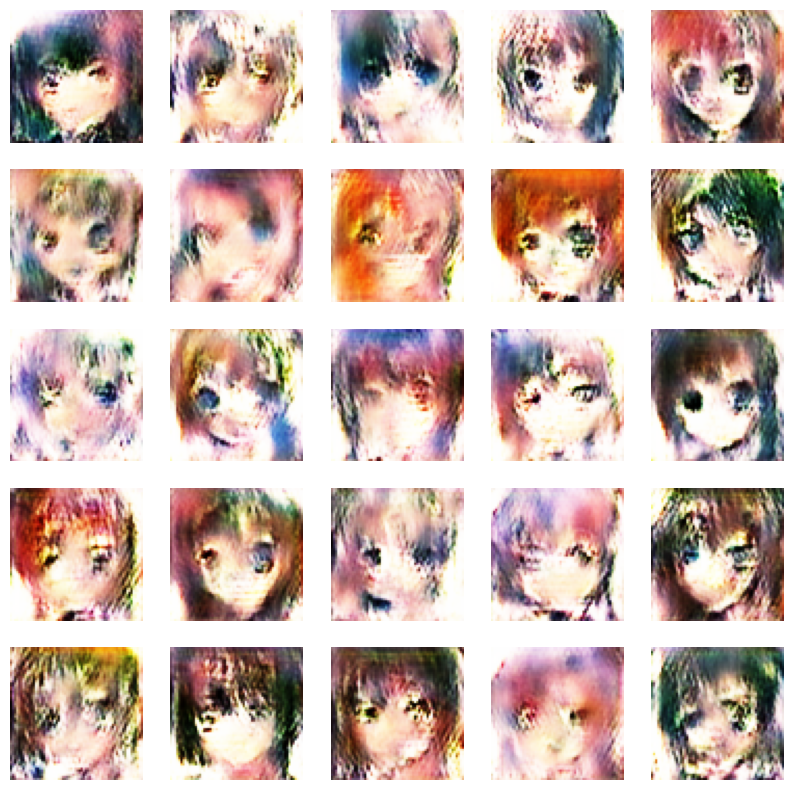

994/994 [==============================] - 166s 166ms/step - d_loss: 0.0340 - g_loss: 28.9467
Epoch 7/100
994/994 [==============================] - ETA: 0s - d_loss: -0.1968 - g_loss: -58.1316

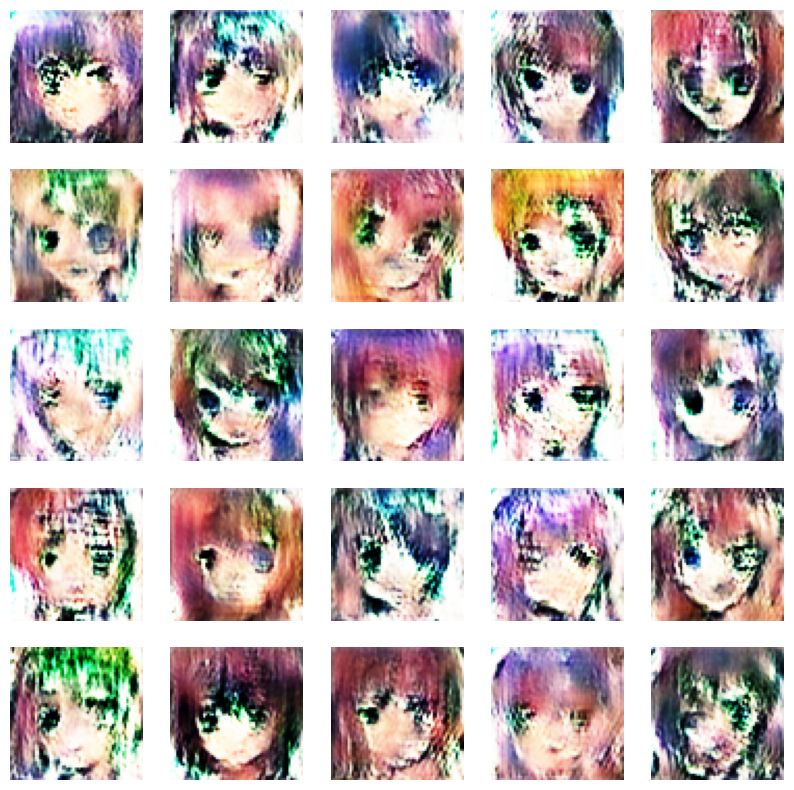

994/994 [==============================] - 163s 164ms/step - d_loss: -0.1212 - g_loss: -58.2101
Epoch 8/100
994/994 [==============================] - ETA: 0s - d_loss: 2.5434 - g_loss: -9.4649

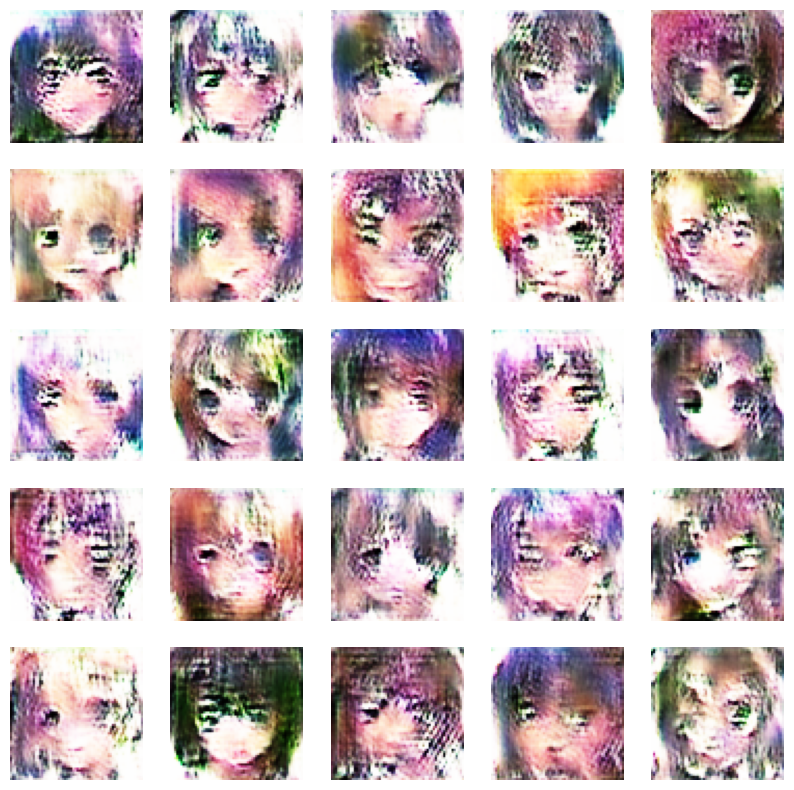

994/994 [==============================] - 161s 162ms/step - d_loss: 3.2604 - g_loss: -8.9864
Epoch 9/100
994/994 [==============================] - ETA: 0s - d_loss: 1.6274 - g_loss: 105.7471

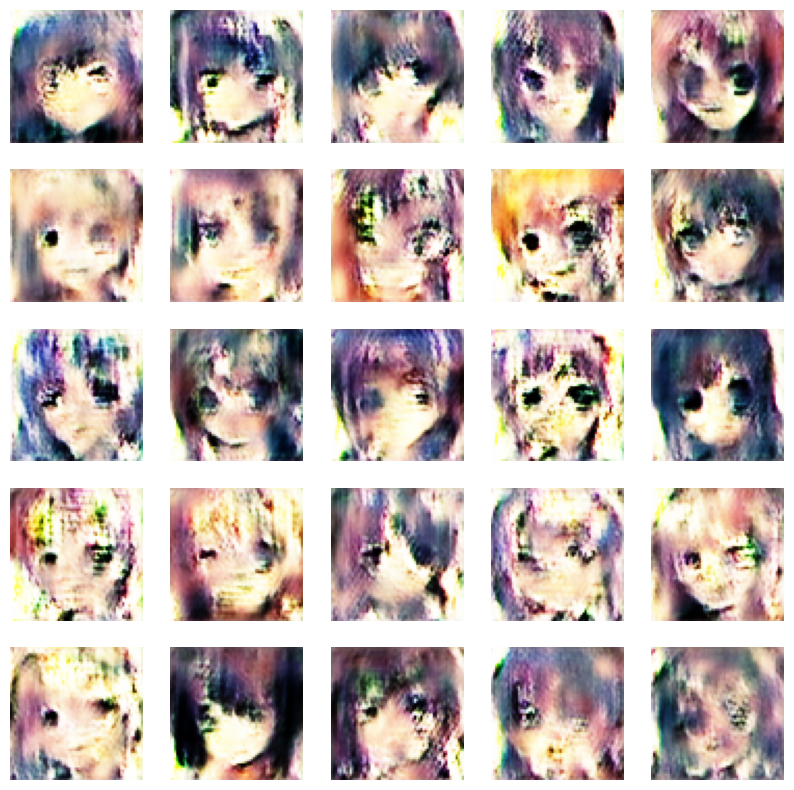

994/994 [==============================] - 161s 162ms/step - d_loss: 1.6269 - g_loss: 105.5170
Epoch 10/100
994/994 [==============================] - ETA: 0s - d_loss: -3.2348 - g_loss: -26.6409

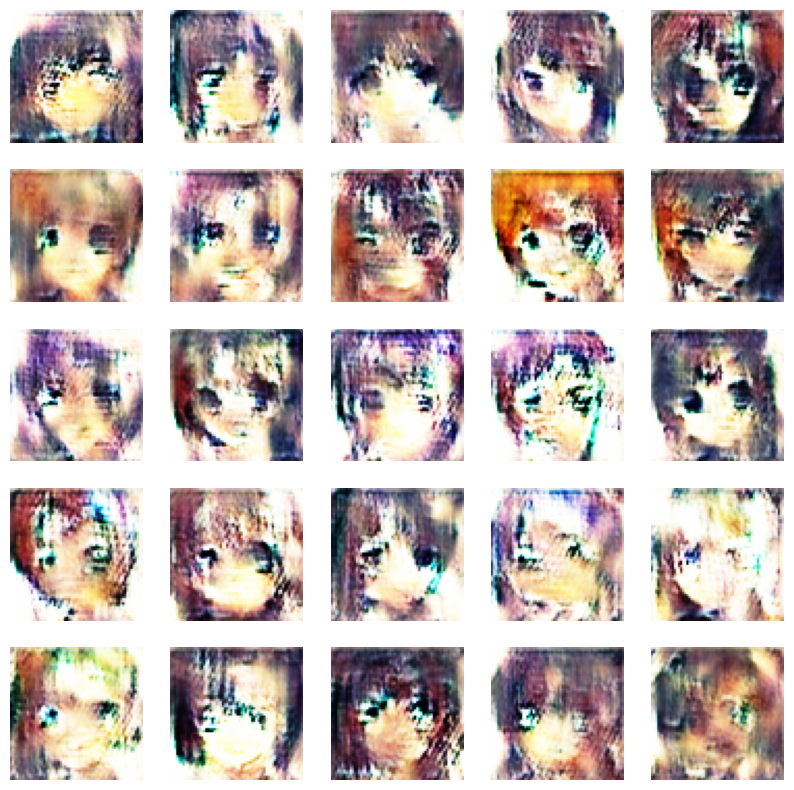

994/994 [==============================] - 163s 164ms/step - d_loss: -3.8040 - g_loss: -26.1934
Epoch 11/100
994/994 [==============================] - ETA: 0s - d_loss: -11.8422 - g_loss: -543.6871WARNING:tensorflow:Compiled the loaded model, but the compiled metrics have yet to be built. `model.compile_metrics` will be empty until you train or evaluate the model.


INFO:tensorflow:Assets written to: /home/guillaume/code/35m5loKiUe/WGAN_DATA/model_saves/generator_after_epoch_10/assets


INFO:tensorflow:Assets written to: /home/guillaume/code/35m5loKiUe/WGAN_DATA/model_saves/generator_after_epoch_10/assets


INFO:tensorflow:Assets written to: /home/guillaume/code/35m5loKiUe/WGAN_DATA/model_saves/discriminator_after_epoch_10/assets


INFO:tensorflow:Assets written to: /home/guillaume/code/35m5loKiUe/WGAN_DATA/model_saves/discriminator_after_epoch_10/assets


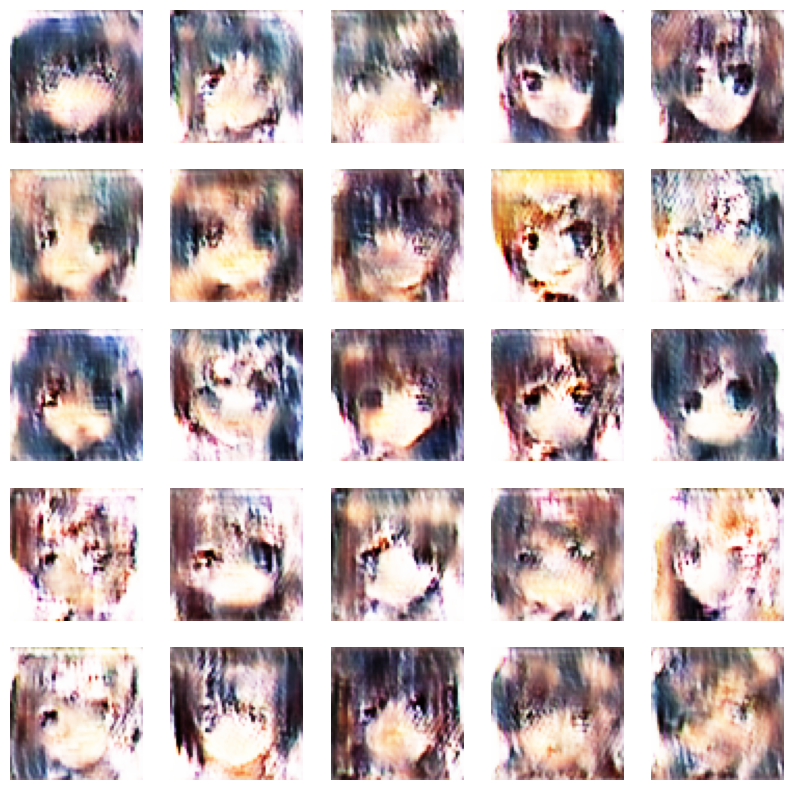

994/994 [==============================] - 169s 170ms/step - d_loss: -13.1978 - g_loss: -540.7282
Epoch 12/100
994/994 [==============================] - ETA: 0s - d_loss: 4.4238 - g_loss: 194.3674

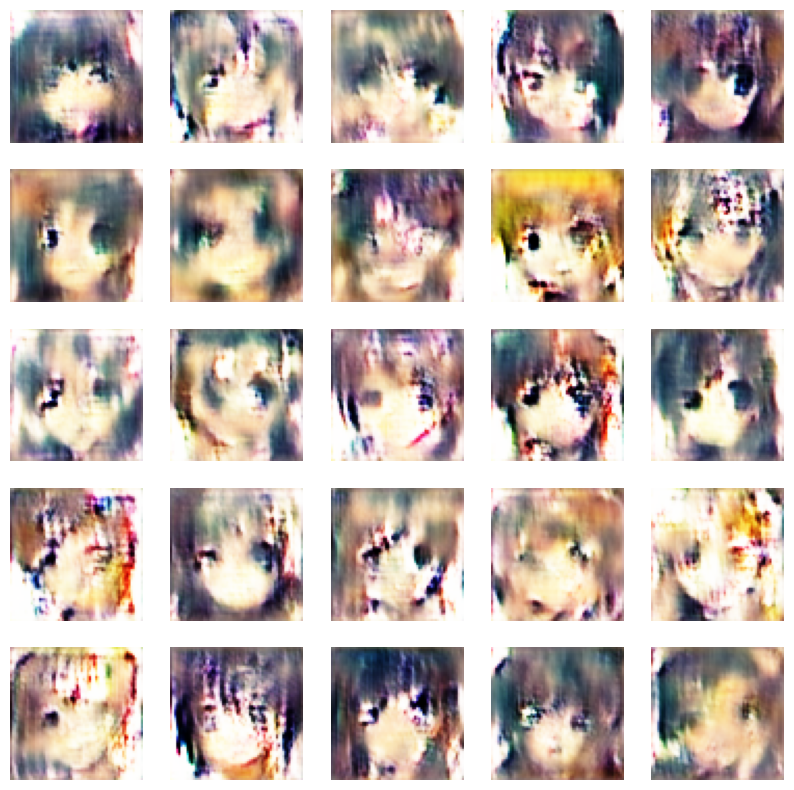

994/994 [==============================] - 165s 166ms/step - d_loss: 4.4454 - g_loss: 193.9571
Epoch 13/100
994/994 [==============================] - ETA: 0s - d_loss: 0.9999 - g_loss: -155.1382

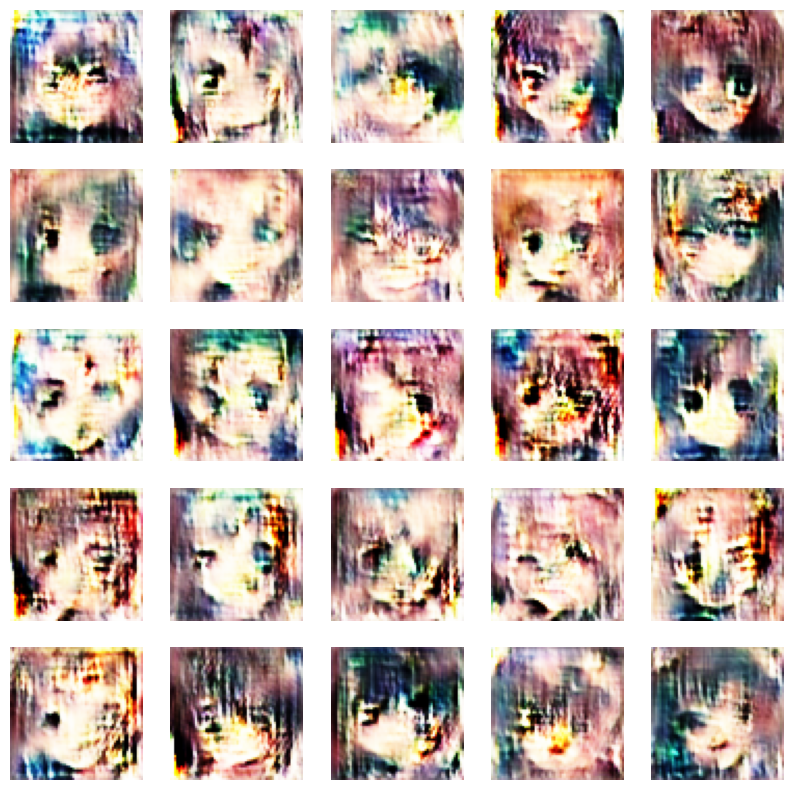

994/994 [==============================] - 163s 164ms/step - d_loss: 0.3529 - g_loss: -155.2820
Epoch 14/100
994/994 [==============================] - ETA: 0s - d_loss: 1.2995 - g_loss: -112.4436

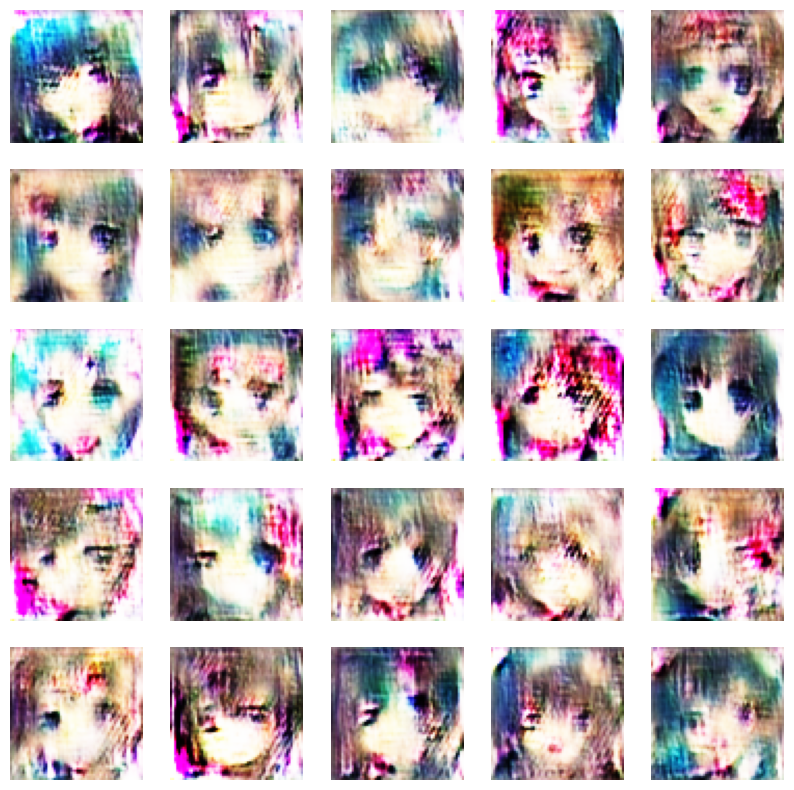

994/994 [==============================] - 164s 165ms/step - d_loss: 1.3070 - g_loss: -112.3863
Epoch 15/100
994/994 [==============================] - ETA: 0s - d_loss: -2.9035 - g_loss: -261.0819

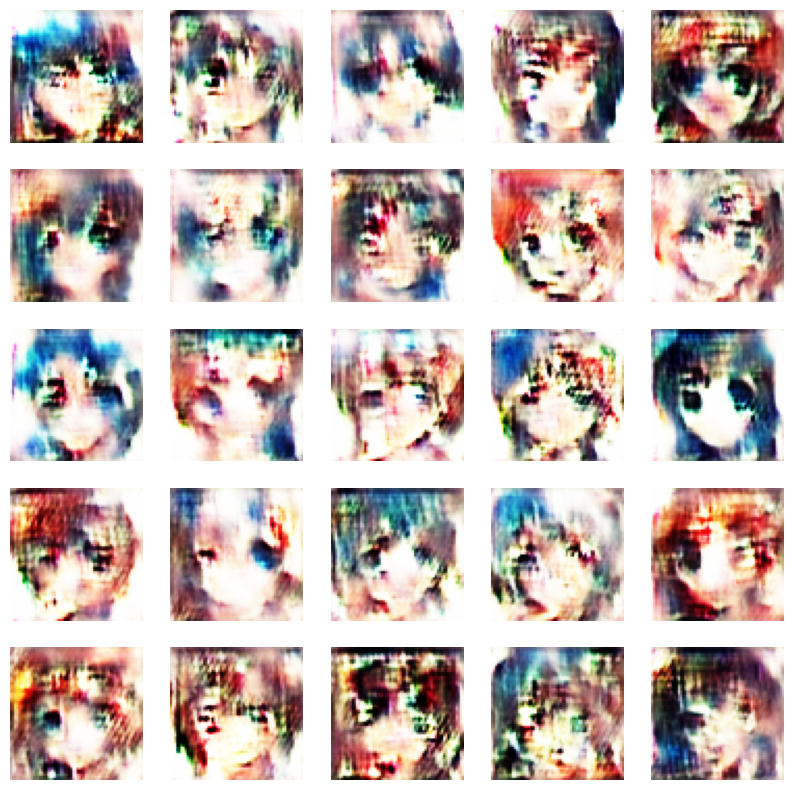

994/994 [==============================] - 162s 163ms/step - d_loss: -2.9163 - g_loss: -260.6125
Epoch 16/100
994/994 [==============================] - ETA: 0s - d_loss: 1.8392 - g_loss: 17.0881WARNING:tensorflow:Compiled the loaded model, but the compiled metrics have yet to be built. `model.compile_metrics` will be empty until you train or evaluate the model.


INFO:tensorflow:Assets written to: /home/guillaume/code/35m5loKiUe/WGAN_DATA/model_saves/generator_after_epoch_15/assets


INFO:tensorflow:Assets written to: /home/guillaume/code/35m5loKiUe/WGAN_DATA/model_saves/generator_after_epoch_15/assets


INFO:tensorflow:Assets written to: /home/guillaume/code/35m5loKiUe/WGAN_DATA/model_saves/discriminator_after_epoch_15/assets


INFO:tensorflow:Assets written to: /home/guillaume/code/35m5loKiUe/WGAN_DATA/model_saves/discriminator_after_epoch_15/assets


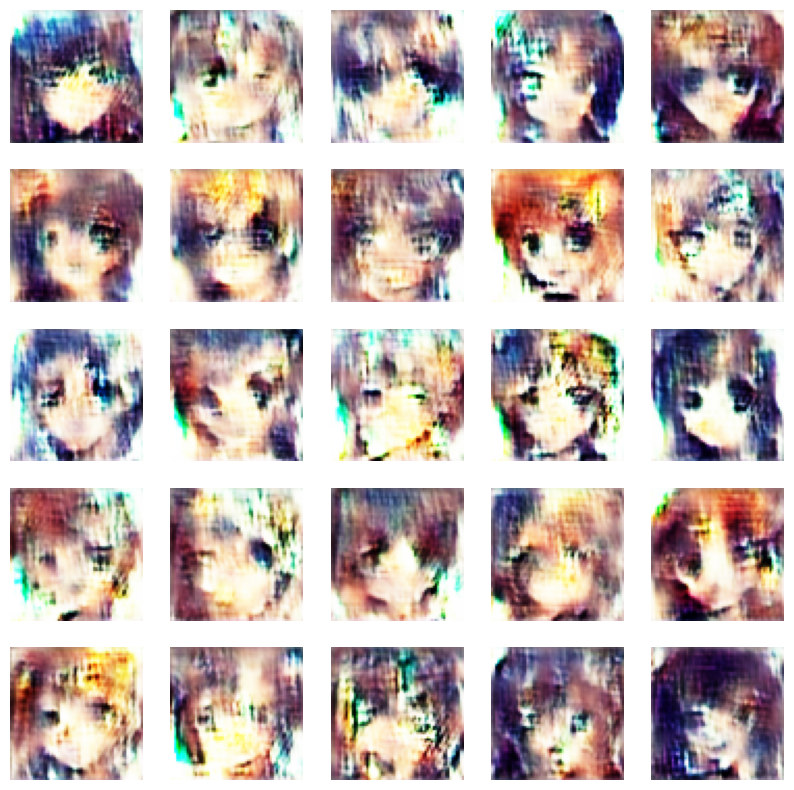

994/994 [==============================] - 165s 166ms/step - d_loss: 1.8256 - g_loss: 17.0592
Epoch 17/100
994/994 [==============================] - ETA: 0s - d_loss: 5.7220 - g_loss: 224.4834

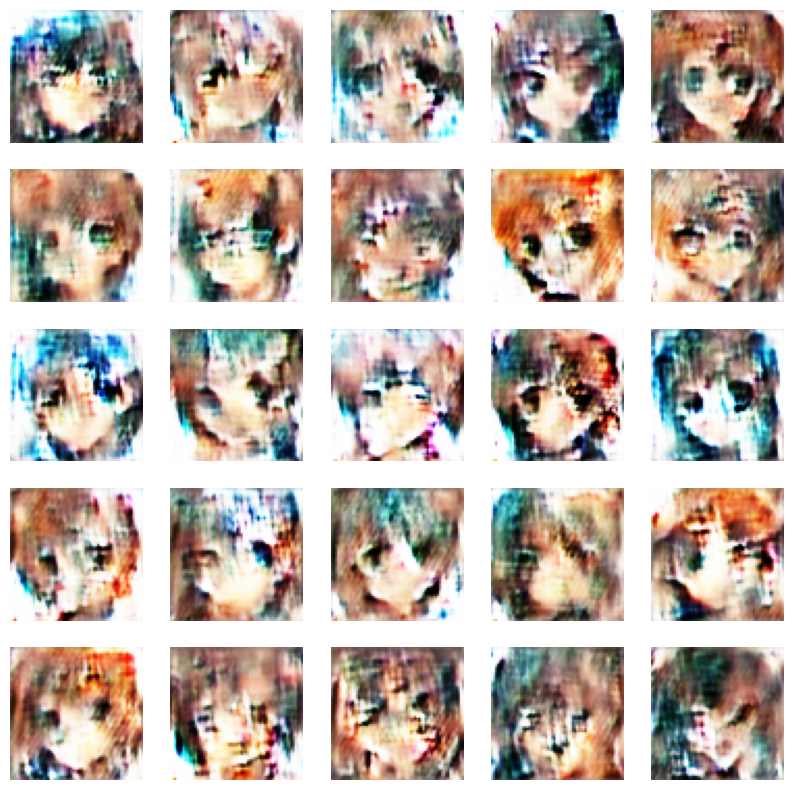

994/994 [==============================] - 163s 164ms/step - d_loss: 5.7154 - g_loss: 224.2357
Epoch 18/100
994/994 [==============================] - ETA: 0s - d_loss: 1.9231 - g_loss: -122.0511

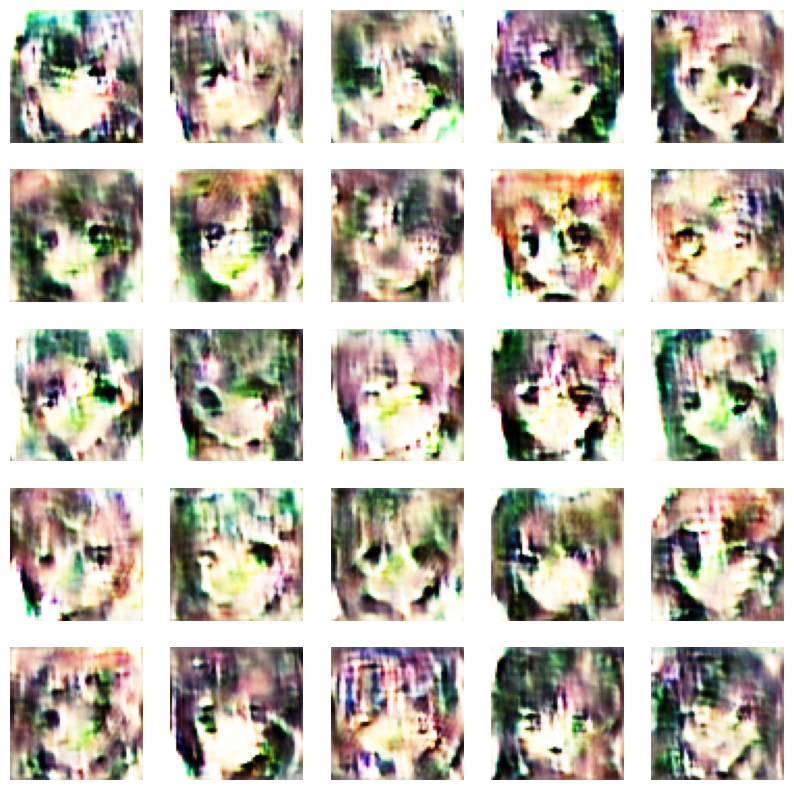

994/994 [==============================] - 162s 163ms/step - d_loss: 2.2884 - g_loss: -121.1909
Epoch 19/100
170/994 [====>.........................] - ETA: 2:16 - d_loss: 12.7492 - g_loss: 85.3300

KeyboardInterrupt: 

In [41]:
# Start training
wgan.fit(train_dataset, batch_size=BATCH_SIZE, epochs=EPOCHS, callbacks=[cbk])

In [ ]:
epoch = 60
generator = keras.models.load_model(os.path.join(ROOT_PATH, MODEL_PATH, 'generator_after_epoch_{epoch}').format(epoch=epoch))
generator = keras.models.load_model(os.path.join(ROOT_PATH, MODEL_PATH, 'discriminator_after_epoch_{epoch}').format(epoch=epoch))

In [ ]:
plt.imshow(np.squeeze(generator.predict(tf.random.normal(shape=(1, 100))), axis=0))

In [ ]:
wgan.ge